In [1]:
%load_ext lab_black

In [2]:
# set up and dependencies
import pandas as pd
import re
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from sklearn.pipeline import make_pipeline
from sklearn.naive_bayes import MultinomialNB
from sklearn.linear_model import LogisticRegression
from matplotlib import pyplot as plt
import plotly.express as px
import plotly.graph_objects as go

import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize

In [3]:
nltk.download("stopwords")

[nltk_data] Downloading package stopwords to
[nltk_data]     /Users/davidvance/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

In [6]:
pd.set_option("display.max_rows", None)

path = "static/data/headlines.csv"

In [7]:
df = pd.read_csv(path)

## some light EDA

In [6]:
df.head(10)

,abstract,document_type,headline,keywords,lead_paragraph,news_desk,pub_date,section_name,snippet,type_of_material,word_count
0,Farhad Manjoo picks four products from 2014 th...,article,"Standouts in Tech: Drones, Virtual Reality, In...","[{'name': 'organizations', 'value': 'Oculus VR...",LOTS of cool new technology products come out ...,Business,2015-01-01,Technology,Farhad Manjoo picks four products from 2014 th...,News,824
1,Representative Steve Scalise’s effort to expla...,article,Much of David Duke’s ’91 Campaign Is Now in Lo...,"[{'name': 'persons', 'value': 'Alford, Jeremy'...","BATON ROUGE, La. — David Duke seems a figure f...",National,2015-01-01,U.S.,Representative Steve Scalise’s effort to expla...,News,1293
2,Minimum wage increases go into effect in 20 st...,article,"States’ Minimum Wages Rise, Helping Millions o...","[{'name': 'subject', 'value': 'Minimum Wage', ...","For some low-wage workers, everyday tasks like...",Business,2015-01-01,Business Day,Minimum wage increases go into effect in 20 st...,News,1017
3,A new job title — chief of laboratory safety —...,article,New C.D.C. Job Overseeing Laboratory Safety,"[{'name': 'persons', 'value': 'McNeil, Donald ...",A new job title — chief of laboratory safety —...,National,2015-01-01,Health,A new job title — chief of laboratory safety —...,Brief,129
4,"Lawyers for Dzhokhar Tsarnaev, the defendant i...",article,Massachusetts: New Effort to Move Bombings Trial,"[{'name': 'subject', 'value': 'Boston Marathon...","Lawyers for Dzhokhar Tsarnaev, the defendant i...",National,2015-01-01,U.S.,"Lawyers for Dzhokhar Tsarnaev, the defendant i...",Brief,145
5,As United States combat operations formally en...,article,"Mission Ends in Afghanistan, but Sacrifices Ar...","[{'name': 'subject', 'value': 'Afghanistan War...","KILLEEN, Tex. — Sgt. First Class Ramon Morris,...",National,2015-01-01,U.S.,As United States combat operations formally en...,News,1425
6,One of the foremost challenges is finding a wa...,article,"Five Surprising Economic Trends in 2014, and W...","[{'name': 'subject', 'value': 'Economic Condit...",It was a confounding year in global financial ...,Business,2015-01-01,The Upshot,One of the foremost challenges is finding a wa...,News,1269
7,"By adopting tabletlike, touch-screen systems, ...",article,Carmakers Take a Hint From Tablets,"[{'name': 'subject', 'value': 'Automobile Safe...","Reaching an apogee of confusion, car dashboard...",Business,2015-01-01,Automobiles,"By adopting tabletlike, touch-screen systems, ...",News,1022
8,"Six months after its introduction, Kindle Unli...",article,Writers Are Mixed Over Amazon Unlimited,"[{'name': 'subject', 'value': 'Amazon Kindle',...","Amazon is disruptive, which means it is divisi...",Business,2015-01-01,Technology,"Six months after its introduction, Kindle Unli...",News,1005
9,Patricia Arquette says being a single mother a...,article,Unashamedly Maturing Into Her Role,"[{'name': 'subject', 'value': 'Movies', 'rank'...","LOS ANGELES — When Patricia Arquette was 19, s...",Arts&Leisure,2015-01-01,Movies,Patricia Arquette says being a single mother a...,News,1478


In [49]:
df = df[df["lead_paragraph"].notna()]
df["lead_paragraph"]

0        LOTS of cool new technology products come out ...
1        BATON ROUGE, La. — David Duke seems a figure f...
2        For some low-wage workers, everyday tasks like...
3        A new job title — chief of laboratory safety —...
4        Lawyers for Dzhokhar Tsarnaev, the defendant i...
5        KILLEEN, Tex. — Sgt. First Class Ramon Morris,...
6        It was a confounding year in global financial ...
7        Reaching an apogee of confusion, car dashboard...
8        Amazon is disruptive, which means it is divisi...
9        LOS ANGELES — When Patricia Arquette was 19, s...
10       “This obviously isn’t for money or glory, so c...
11       NAPLES, Fla. — For a long stretch, government ...
12       LONDON — Europe’s tax showdown could be headed...
13       John I. Goodlad, an influential educator whose...
14       Former Gov. Jeb Bush of Florida has resigned f...
15       Its first attempt to develop genetically engin...
16       TOKYO — When she was pregnant with the first o.

In [42]:
df["lead_paragraph"]

0        LOTS of cool new technology products come out ...
1        BATON ROUGE, La. — David Duke seems a figure f...
2        For some low-wage workers, everyday tasks like...
3        A new job title — chief of laboratory safety —...
4        Lawyers for Dzhokhar Tsarnaev, the defendant i...
5        KILLEEN, Tex. — Sgt. First Class Ramon Morris,...
6        It was a confounding year in global financial ...
7        Reaching an apogee of confusion, car dashboard...
8        Amazon is disruptive, which means it is divisi...
9        LOS ANGELES — When Patricia Arquette was 19, s...
10       “This obviously isn’t for money or glory, so c...
11       NAPLES, Fla. — For a long stretch, government ...
12       LONDON — Europe’s tax showdown could be headed...
13       John I. Goodlad, an influential educator whose...
14       Former Gov. Jeb Bush of Florida has resigned f...
15       Its first attempt to develop genetically engin...
16       TOKYO — When she was pregnant with the first o.

In [7]:
df.describe()

,word_count
count,50572.000000
mean,821.500000
std,677.229014
min,1.000000
25%,400.000000
50%,771.000000
75%,1137.000000
max,27976.000000


In [48]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 50445 entries, 0 to 50571
Data columns (total 11 columns):
 #   Column            Non-Null Count  Dtype 
---  ------            --------------  ----- 
 0   abstract          50445 non-null  object
 1   document_type     50445 non-null  object
 2   headline          50445 non-null  object
 3   keywords          50445 non-null  object
 4   lead_paragraph    50445 non-null  object
 5   news_desk         50445 non-null  object
 6   pub_date          50445 non-null  object
 7   section_name      50445 non-null  object
 8   snippet           50444 non-null  object
 9   type_of_material  50445 non-null  object
 10  word_count        50445 non-null  int64 
dtypes: int64(1), object(10)
memory usage: 4.6+ MB


In [12]:
df["headline"].astype(str)

0        Standouts in Tech: Drones, Virtual Reality, In...
1        Much of David Duke’s ’91 Campaign Is Now in Lo...
2        States’ Minimum Wages Rise, Helping Millions o...
3             New C.D.C. Job Overseeing Laboratory Safety 
4         Massachusetts: New Effort to Move Bombings Trial
5        Mission Ends in Afghanistan, but Sacrifices Ar...
6        Five Surprising Economic Trends in 2014, and W...
7                      Carmakers Take a Hint From Tablets 
8                  Writers Are Mixed Over Amazon Unlimited
9                       Unashamedly Maturing Into Her Role
10                   Where Big Stars and Space Heaters Mix
11          Government Spending, Edging Up, Is a Stimulus 
12           Digital Tax Increase to Take Effect in Europe
13       John I. Goodlad, Progressive Educator, Dies at 94
14       Jeb Bush Resigns From Board Seats, Possibly Ed...
15       By ‘Editing’ Plant Genes, Companies Avoid Regu...
16             To Rescue Economy, Japan Turns to Supermo

In [11]:
df["headline"].values.to_json()

AttributeError: 'numpy.ndarray' object has no attribute 'to_json'

In [9]:
df["abstract"]

0        Farhad Manjoo picks four products from 2014 th...
1        Representative Steve Scalise’s effort to expla...
2        Minimum wage increases go into effect in 20 st...
3        A new job title — chief of laboratory safety —...
4        Lawyers for Dzhokhar Tsarnaev, the defendant i...
5        As United States combat operations formally en...
6        One of the foremost challenges is finding a wa...
7        By adopting tabletlike, touch-screen systems, ...
8        Six months after its introduction, Kindle Unli...
9        Patricia Arquette says being a single mother a...
10       Why Classic Stage Company continues to draw bi...
11       State and local governments are spending on pr...
12       New rules are coming into force for services l...
13       Many of the views put forth by Professor Goodl...
14       Mr. Bush gave up positions at an online educat...
15       Critics of bioengineered crops are concerned t...
16       Prime Minister Shinzo Abe pledged to make it e.

In [10]:
df["document_type"].unique()

array(['article'], dtype=object)

In [11]:
df["type_of_material"].unique()

array(['News', 'Brief', 'Obituary (Obit)', 'Question', 'Schedule',
       'Review', 'List', 'Letter', 'Interview', 'News Analysis', 'Text',
       'Web Log', 'Economic Analysis', 'Op-Ed', 'Editorial',
       'Special Report', 'recipe', 'briefing', 'Newsletter', 'Series',
       'An Analysis'], dtype=object)

In [12]:
df["news_desk"].unique()

array(['Business', 'National', 'Arts&Leisure', 'Science', 'Society',
       'Politics', 'Media', 'Climate'], dtype=object)

In [13]:
df["section_name"].unique()

array(['Technology', 'U.S.', 'Business Day', 'Health', 'The Upshot',
       'Automobiles', 'Movies', 'Theater', 'Your Money', 'Arts',
       'Science', 'Fashion & Style', 'Education', 'Real Estate', 'Food',
       'World', 'Style', 'New York', 'Books', 'Universal', 'Job Market',
       'Obituaries', 'Magazine', 'Sports', 'NYT Now', 'Opinion',
       'Times Insider', 'Giving', 'Sunday Review', 'Well', 'Watching',
       'Climate', 'Travel', 'Smarter Living', 'Reader Center'],
      dtype=object)

In [14]:
df["news_desk"].value_counts()

Business        20271
National        16054
Science          4021
Society          3984
Arts&Leisure     3350
Politics         2779
Climate           107
Media               6
Name: news_desk, dtype: int64

In [15]:
df["section_name"].value_counts()

U.S.               17653
Business Day       13883
Technology          4181
Fashion & Style     3959
Health              2298
Science             2172
Arts                2035
Your Money           843
Movies               807
Theater              557
The Upshot           529
Well                 363
Real Estate          353
Automobiles          273
Climate              179
World                121
Education             69
Style                 59
New York              42
Watching              37
Smarter Living        34
Books                 25
Food                  16
Reader Center         16
Obituaries            15
Giving                13
Times Insider         12
NYT Now                8
Magazine               8
Job Market             4
Sports                 2
Travel                 2
Universal              2
Opinion                1
Sunday Review          1
Name: section_name, dtype: int64

# Bigrams

### Prepare the data from scikit-learn¶

In [17]:
X = df['text'].values
y = df['class'].values

X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=7)

KeyError: 'text'

### Categorical Bigram Naive Bayes (currently don't have a categorical option - try other methods)

In [ ]:
%%time

bigram_naive_bayes = make_pipeline(
    CountVectorizer(
        stop_words='english',
        binary=True,
        ngram_range=(1, 2) # change to (2, 2) to get only bigrams, no unigrams. For trigrams (3, 3), and for bigrams and trigrams (2, 3).
    ),
    MultinomialNB()
)

bigram_naive_bayes.fit(X_train, y_train)

print(f'Accuracy: {bigram_naive_bayes.score(X_test, y_test)} \n')
print(classification_report(y_test, bigram_naive_bayes.predict(X_test)))

### **TF-IDF**

#### review NLP from class 1/10/21, last section of video

In [14]:
txt1 = df["abstract"]
txt2 = df["headline"]
txt3 = df["lead_paragraph"]

In [15]:
stoplist = stopwords.words("english")

In [19]:
# Get bigrams
vectorizer1 = CountVectorizer(stop_words=stoplist, ngram_range=(3, 3))
X1 = vectorizer1.fit_transform(txt2)
features = vectorizer1.get_feature_names()
print("X1 : \n", X1.toarray())

X1 : 
 [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]


In [20]:
# Applying TFIDF
# You can still get n-grams here
vectorizer2 = TfidfVectorizer(stop_words=stoplist, ngram_range=(2, 2))
X2 = vectorizer2.fit_transform(txt1)
scores = X2.toarray()
print("Scores : \n", scores)

Scores : 
 [[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


In [53]:
# Getting top ranking features
sums = X1.sum(axis=0)
data1 = []
for col, term in enumerate(features):
    data1.append((term, sums[0, col]))
ranking = pd.DataFrame(data1, columns=["term", "rank"])
words = ranking.sort_values("rank", ascending=False)
print("Words : \n", words.head(20))

Words : 
                         term  rank
203597          donald trump  2909
450037              new york  2737
698116         united states  2229
514357       president trump  1499
576709         san francisco  1161
514155       president obama  1141
310965       hillary clinton  1137
391043           los angeles   985
406966      married saturday   910
124185       chief executive   871
730465           white house   834
745769              year old   822
649911         supreme court   815
367081             last year   758
746417             years ago   757
491301    performed ceremony   714
367072             last week   686
749322            york times   680
719521  washington president   635
698205        universal life   583


In [26]:
# Get headline bigrams
vectorizer3 = CountVectorizer(stop_words=stoplist, ngram_range=(2, 2))
X3 = vectorizer3.fit_transform(txt2)
features = vectorizer3.get_feature_names()
print("X1 : \n", X1.toarray())

X1 : 
 [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]


In [20]:
# Get headline trigrams
vectorizer3 = CountVectorizer(stop_words=stoplist, ngram_range=(3, 3))
X3 = vectorizer3.fit_transform(txt2)
features = vectorizer3.get_feature_names()
# df = pd.DataFrame(X, columns=features).sum(axis=1) # Ed's suggestion for getting trigrams and number of occurrences
print("X1 : \n", X1.toarray())

X1 : 
 [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]


In [25]:
# Getting top ranking features
sums = X3.sum(axis=0)
data1 = []
for col, term in enumerate(features):
    data1.append((term, sums[0, col]))
ranking = pd.DataFrame(data1, columns=["term", "rank"])
words = ranking.sort_values("rank", ascending=False)
print("Words : \n", words.head(20))

Words : 
                             term  rank
13933          auctions set week   142
196175     treasury auctions set   142
153038  real estate transactions   129
41380     commercial real estate   129
153629    recent commercial real   128
69764           farhad mike week    86
121534            mike week tech    83
129781            new york times    80
58116          donald trump says    60
5101         affordable care act    41
191776         think like doctor    39
169871         self driving cars    38
57548      donald trump campaign    35
89882     hillary clinton bernie    34
38392     clinton bernie sanders    34
189852             ted cruz iowa    30
87771            health care law    29
38582       clinton donald trump    28
97827              iowa bus tour    28
47644              cruz iowa bus    28


In [28]:
rank_df = words.head(n=50)

In [37]:
# f = open(path)  # Not sure how to actually get the data for this method since I'm pulling from a csv and originally put directly into a dataframe
# raw = f.read()  # Gets the whole file, so need to figure out how to tokenize only headlines...
# print(raw)

headline = df["headline"].astype(str).values

type(headline)

numpy.ndarray

In [36]:


tokens = nltk.word_tokenize(headline)

#Create your bigrams
bgs = nltk.bigrams(tokens)

#compute frequency distribution for all the bigrams in the text
fdist = nltk.FreqDist(bgs)
for k,v in fdist.items():
    print(k,v)

TypeError: cannot use a string pattern on a bytes-like object

#### **Plots**

<AxesSubplot:xlabel='term'>

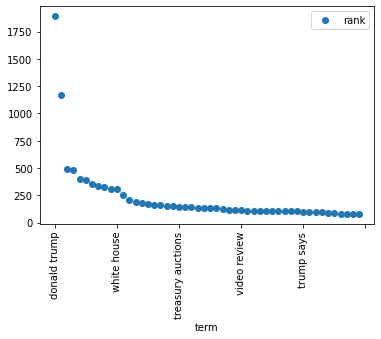

In [29]:
rank_df.plot(x="term", y="rank", style="o", rot=90)

In [30]:
# Bigram bubble chart

fig = px.scatter(
    rank_df,
    x="term",
    y="rank",
    hover_name="term",
    text="term",
    size="rank",
    color="term",
    size_max=45,
    template="plotly_white",
    title="Bigram similarity and frequency",
    labels={"words": "Avg. Length<BR>(words)", orientation=70},
    color_continuous_scale=px.colors.sequential.Sunsetdark,
)
fig.update_traces(marker=dict(line=dict(width=1, color="Gray")))
fig.update_xaxes(visible=True)
fig.update_yaxes(visible=True)
fig.show()

In [31]:
trigram = rank_df["term"]
rank = rank_df["rank"]

In [32]:
fig = go.Figure(
    data=go.Scattergl(
        x=trigram,
        y=rank,
        mode="markers",
        marker=dict(color=rank, colorscale="Viridis", line_width=1),
    )
)

fig.show()

#### **Bigram TF-IDF Logistic Regression**

In [ ]:
%%time

bigram_tfidf_logistic_regression = make_pipeline(
    CountVectorizer(
        stop_words='english',
        ngram_range=(1,2)
    ),
    TfidfTransformer(),
    LogisticRegression()
)

bigram_tfidf_logistic_regression.fit(X_train, y_train)

print(f'Accuracy: {bigram_tfidf_logistic_regression.score(X_test, y_test)} \n')
print(classification_report(y_test, bigram_tfidf_logistic_regression.predict(X_test)))

## Extra: word_count prediction based on news_desk and section_name, distinguish by type_of_material